## top template

### 参考URL
- https://deepblue-ts.co.jp/%E7%B5%B1%E8%A8%88%E5%AD%A6/%E3%83%99%E3%82%A4%E3%82%BA%E7%B5%B1%E8%A8%88/pyro-try/

### github
- jupyter notebook形式のファイルは[こちら](https://github.com/hiroshi0530/wa-src/blob/master/article/library/scipy/template/template_nb.ipynb)

### google colaboratory
- google colaboratory で実行する場合は[こちら](https://colab.research.google.com/github/hiroshi0530/wa-src/blob/master/article/library/scipy/template/template_nb.ipynb)

### 筆者の環境
筆者のOSはmacOSです。LinuxやUnixのコマンドとはオプションが異なります。

In [1]:
!sw_vers

ProductName:	Mac OS X
ProductVersion:	10.14.6
BuildVersion:	18G6032


In [2]:
!python -V

Python 3.8.5


基本的なライブラリをインポートしそのバージョンを確認しておきます。

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import matplotlib
import matplotlib.pyplot as plt
import scipy
import numpy as np

print('matplotlib version :', matplotlib.__version__)
print('scipy version :', scipy.__version__)
print('numpy version :', np.__version__)

matplotlib version : 3.3.2
scipy version : 1.5.2
numpy version : 1.18.5


In [4]:
import torch
import torch.distributions.constraints as constraints
import pyro 
import pyro.distributions as dist

In [5]:
from pyro.infer.mcmc import MCMC
from pyro.infer.mcmc import NUTS
from pyro.optim import Adam
from pyro.infer import SVI
from pyro.infer import Trace_ELBO
from pyro.infer import Predictive

In [6]:
print('torch version :', torch.__version__)
print('pyro version :', pyro.__version__)

torch version : 1.7.0
pyro version : 1.5.1


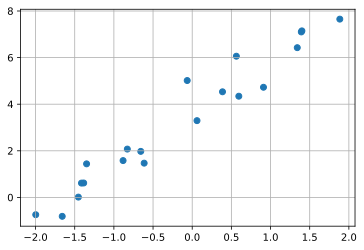

In [7]:
x = np.random.uniform(-2,2,20)
y = 2 * x + 3 + np.random.normal(0,1,20)

plt.grid()
plt.scatter(x,y)
plt.show()

In [8]:
x = torch.tensor(x)
y = torch.tensor(y)

In [9]:
print('x type :', type(x))
print('y type :', type(y))
print('x shape :', x.shape)
print('y shape :', y.shape)

x type : <class 'torch.Tensor'>
y type : <class 'torch.Tensor'>
x shape : torch.Size([20])
y shape : torch.Size([20])


## MCMCサンプリング(NUTS)

### モデルの構築

In [10]:
def model(x,y):
  a = pyro.sample('a', dist.Normal(0., 5.))
  b = pyro.sample('b', dist.Normal(0.,5.))
  y = pyro.sample('y', dist.Normal(a*x + b, 1.), obs=y)
  return y

In [11]:
nuts_kernel = NUTS(model, adapt_step_size=True)
mcmc_run = MCMC(nuts_kernel, num_samples=1000, warmup_steps=1000)
mcmc_run.run(x, y)

Sample: 100%|█████████████████████████████| 2000/2000 [00:10, 198.96it/s, step size=9.98e-01, acc. prob=0.877]


MCMCで得られたサンプルの取得

In [12]:
posterior_a = mcmc_run.get_samples()['a']
posterior_b = mcmc_run.get_samples()['b']

In [13]:
print(posterior_a[:20])

tensor([2.8355, 2.7370, 2.7370, 2.0700, 2.1688, 2.4700, 1.9804, 2.4388, 2.4116,
        2.4116, 2.2302, 2.2365, 2.3438, 2.2297, 2.2256, 2.1555, 2.2773, 2.2274,
        2.2664, 2.2103], dtype=torch.float64)


In [14]:
print(posterior_b[:20])

tensor([3.5353, 3.6787, 3.6787, 3.6408, 4.0378, 3.7112, 3.5571, 3.2672, 3.5452,
        3.5452, 3.5789, 3.5862, 3.7441, 3.5808, 3.6269, 3.3852, 3.9679, 3.3639,
        3.8180, 3.5705], dtype=torch.float64)


次にこのサンプルを用いた予測分布の計算を行います。
こちらも関数一つで予測分布の計算が行えるので簡単です。

In [15]:
pred = Predictive(model,{'a':posterior_a,'b':posterior_b},return_sites=["y"])

In [16]:
x_ = np.linspace(-2,2,100)
y_ = pred.get_samples(torch.tensor(x_),None)['y']

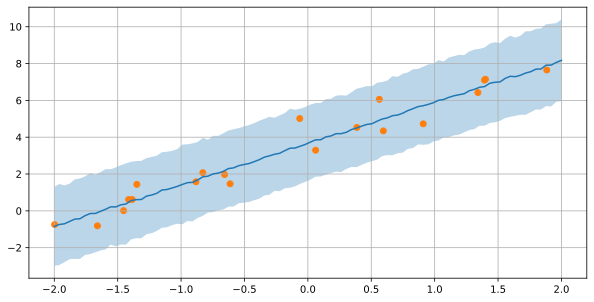

In [17]:
y_mean = y_.mean(0)
y_std = y_.std(0)
plt.figure(figsize=(10,5))
plt.plot(x_,y_mean)
plt.fill_between(x_,y_mean-y_std*2,y_mean+y_std*2,alpha=0.3)
plt.grid()
plt.scatter(x,y)
plt.show()

## 変分推論

In [18]:
def guide(x,y):
  a_loc = pyro.param('a_loc',torch.tensor(0.))
  b_loc = pyro.param('b_loc',torch.tensor(0.))
  a_scale = pyro.param('a_scale',torch.tensor(1.),constraints.positive)
  b_scale = pyro.param('b_scale',torch.tensor(1.),constraints.positive)
  pyro.sample('a',dist.Normal(a_loc,a_scale))
  pyro.sample('b',dist.Normal(b_loc,b_scale))

In [20]:
adam_params = {"lr": 0.001, "betas": (0.90, 0.999)}
optimizer = Adam(adam_params)

# setup the inference algorithm
svi = SVI(model, guide, optimizer, loss=Trace_ELBO())

n_steps = 1000
# do gradient steps
for step in range(n_steps):
  svi.step(x, y)

In [21]:
for name in pyro.get_param_store():
  print(name + ':{}'.format(pyro.param(name)))

a_loc:0.7868573069572449
b_loc:0.906243085861206
a_scale:0.7018969058990479
b_scale:0.8006583452224731


In [22]:
y_pred = Predictive(model=model,guide=guide,num_samples=1000,return_sites=["y"])

In [23]:
x_ = torch.tensor(np.linspace(-2,2,100))
y_ = y_pred.get_samples(x_,None)

In [ ]:
y_mean = y_['y'].mean(0).detach()
y_std = y_['y'].std(0).detach()
plt.figure(figsize=(10,5))
plt.plot(x_,y_mean)
plt.fill_between(x_,y_mean-y_std*2,y_mean+y_std*2,alpha=0.3)
plt.grid()
plt.scatter(x,y)
plt.show()

In [25]:
# aについて
a = np.random.normal(pyro.param('a_loc').detach().numpy(),
                     pyro.param('a_scale').detach().numpy(),1000)
plt.hist(a,density=True,bins=50)
plt.grid()
plt.hist(posterior_a,density=True,alpha=0.5,bins=50)
plt.show()

In [26]:
# bについて
b = np.random.normal(pyro.param('b_loc').detach().numpy(),
                     pyro.param('b_scale').detach().numpy(),1000)
plt.hist(b,density=True,bins=50)
plt.grid()
plt.hist(posterior_b,density=True,alpha=0.5,bins=50)
plt.show()

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x117e7d4c0> (for post_execute):


KeyboardInterrupt: 

## まとめ